In [1]:
import numpy as np 
import pandas as pd
import tensorflow as tf
from tensorflow import keras 
from tensorflow.keras import models, layers, Sequential
import matplotlib.pyplot as plt
%matplotlib inline 

### Data Collection and Preprocessing 

In [2]:
IMAGE_SIZE = 256
BATCH_SIZE = 32
CHANNELS = 3
EPOCHS = 50  

In [3]:
# creating the dataset 
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    'PlantVillage', 
    shuffle=True, 
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE 
)

Found 16011 files belonging to 10 classes.


In [4]:
# get class names 
class_names = dataset.class_names
class_names 

['Tomato_Bacterial_spot',
 'Tomato_Early_blight',
 'Tomato_Late_blight',
 'Tomato_Leaf_Mold',
 'Tomato_Septoria_leaf_spot',
 'Tomato_Spider_mites_Two_spotted_spider_mite',
 'Tomato__Target_Spot',
 'Tomato__Tomato_YellowLeaf__Curl_Virus',
 'Tomato__Tomato_mosaic_virus',
 'Tomato_healthy']

In [5]:
len(dataset) 

501

In [6]:
501*32

16032

In [7]:
# to get the image batch shape and label batch 
for image_batch, label_batch in dataset.take(1): 
    print(image_batch.shape)
    print(label_batch.numpy()) 

(32, 256, 256, 3)
[7 7 0 7 0 2 2 8 6 3 2 2 9 2 9 5 1 7 6 0 3 0 2 7 5 7 7 9 8 9 4 5]


In [8]:
for image_batch, label_batch in dataset.take(1):
    print(image_batch[0].shape) 

(256, 256, 3)


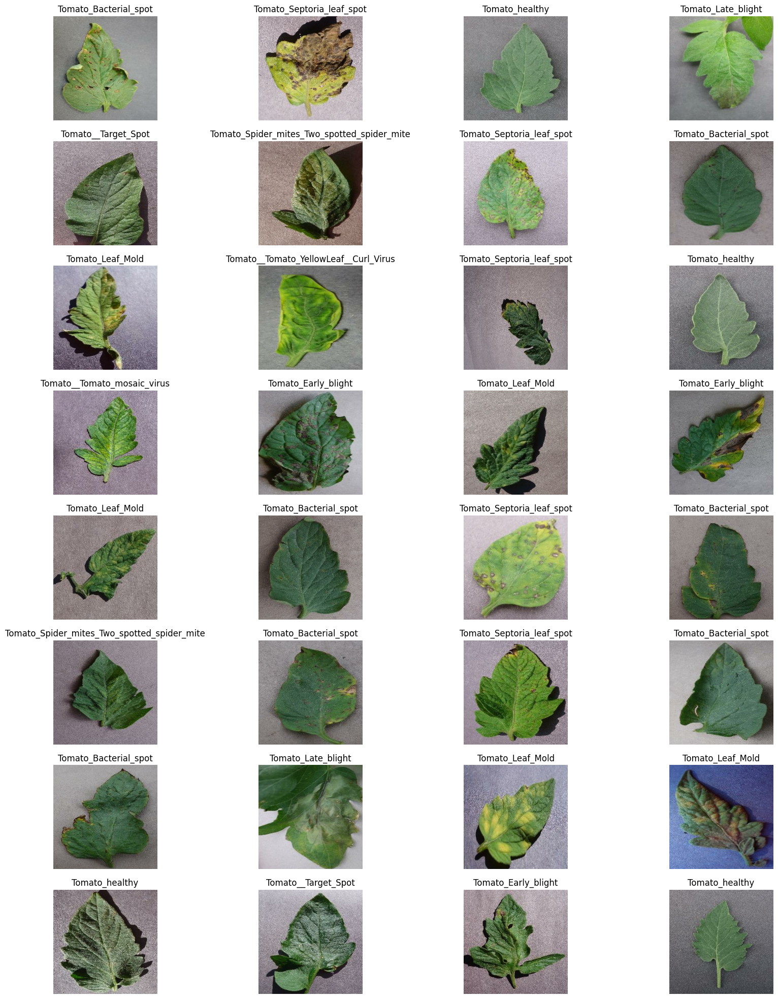

In [9]:
# visualize the sample batch images 
for image_batch, label_batch in dataset.take(1): 
    plt.figure(figsize=(20,25)) 
    
    for i in range(32):
        ax = plt.subplot(8,4, i+1) 
        plt.imshow(image_batch[i].numpy().astype('uint8'))
        plt.title(class_names[label_batch[i]])
        plt.axis('off') 

In [10]:
len(dataset) 

501

In [11]:
# check the blurry images 
import cv2

blurry_images = []

# function to calculate variance of Laplacian (blurriness score)
def is_blurry(image, threshold=100.0): 
    # convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # compute laplacian
    lap_var = cv2.Laplacian(gray, cv2.CV_64F).var()
    
    return lap_var < threshold  # if ture its blurry, also return the score
        

In [12]:
# iterate through the dataset
for image_batch, label_batch in dataset: 
    for i in range(image_batch.shape[0]): 
        img = image_batch[i].numpy().astype(np.uint8) 
        blurry = is_blurry(img) 
        
        if blurry: 
            blurry_images.append(img)

len(blurry_images) 

842

In [13]:
blurry_images[0] 

array([[[ 78,  82,  83],
        [ 81,  85,  86],
        [ 85,  89,  90],
        ...,
        [114, 118, 119],
        [111, 115, 116],
        [108, 112, 113]],

       [[ 85,  89,  90],
        [ 87,  91,  92],
        [ 89,  93,  94],
        ...,
        [111, 115, 116],
        [107, 111, 112],
        [102, 106, 107]],

       [[ 91,  95,  96],
        [ 91,  95,  96],
        [ 91,  95,  96],
        ...,
        [113, 117, 118],
        [108, 112, 113],
        [103, 107, 108]],

       ...,

       [[117, 118, 113],
        [117, 118, 113],
        [117, 118, 113],
        ...,
        [138, 139, 131],
        [138, 139, 131],
        [138, 139, 131]],

       [[118, 119, 114],
        [118, 119, 114],
        [118, 119, 114],
        ...,
        [137, 138, 130],
        [138, 139, 131],
        [138, 139, 131]],

       [[119, 120, 115],
        [119, 120, 115],
        [119, 120, 115],
        ...,
        [137, 138, 130],
        [137, 138, 130],
        [137, 138, 130]]

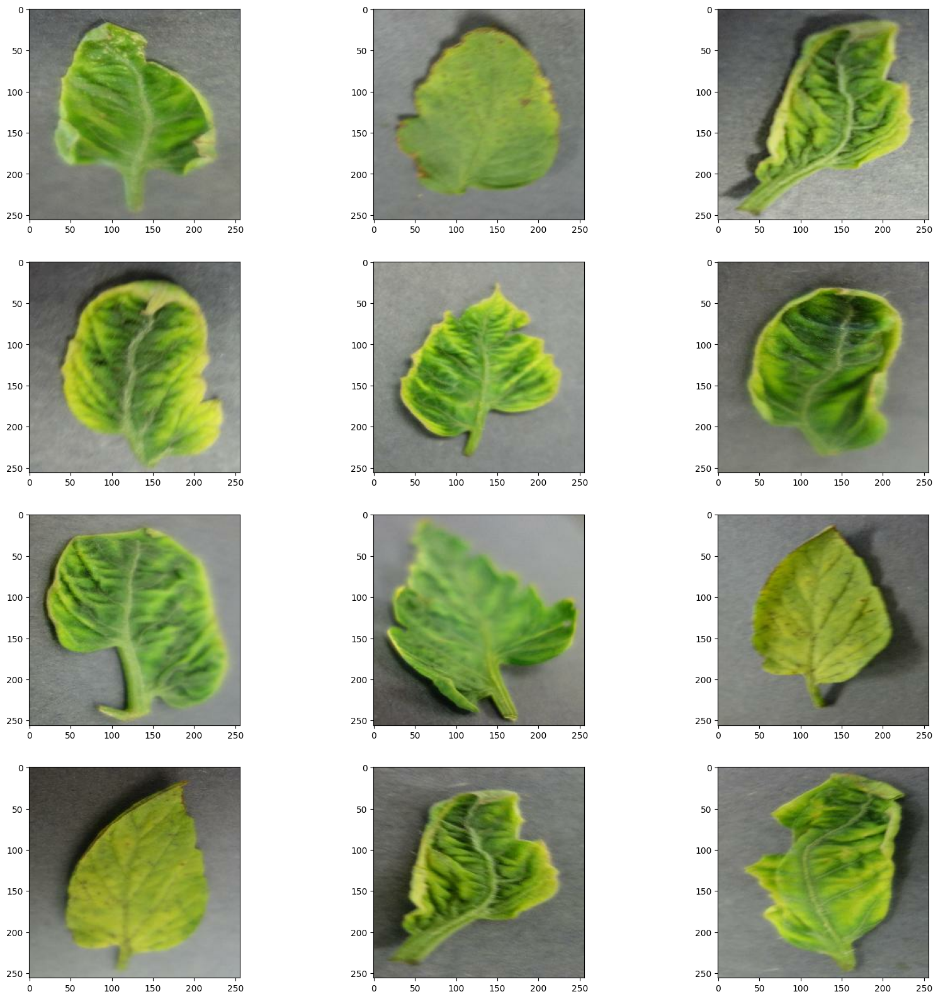

In [14]:
i = 0
plt.figure(figsize=(20,20))
for image in blurry_images[:12]: 
    plt.subplot(4,3, i+1) 
    plt.imshow(image)
    
    i += 1   

Text(0.5, 1.0, 'Blurry Image')

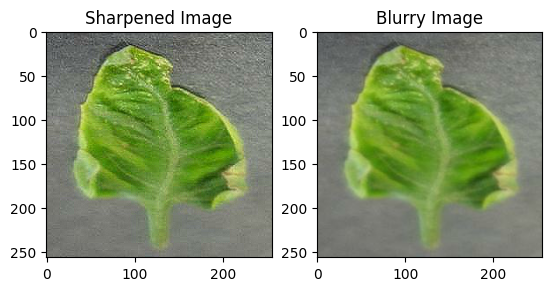

In [15]:
def sharpen_image(image): 
    sharpening_kernel = np.array([
        [0, -1, 0],
        [-1, 5, -1],
        [0, -1, 0]
    ])
    # apply the filter
    return cv2.filter2D(image, -1, sharpening_kernel) 

plt.subplot(1,2,1)
plt.imshow(sharpen_image(blurry_images[0]) )
plt.title('Sharpened Image')

plt.subplot(1,2,2)
plt.imshow(blurry_images[0])
plt.title('Blurry Image')

In [16]:
(len(blurry_images)/(len(dataset)*32)) * 100 

# blury images are 5% of the dataset. so it is not a big deal. we can keep them
# these blurry images can detect 

5.251996007984032

In [17]:
'''
80% ==> training
20% ==> 10% validation 10% test 
'''

'\n80% ==> training\n20% ==> 10% validation 10% test \n'

In [18]:
len(dataset) 

501

In [19]:
training_size = 0.8
len(dataset) * training_size 

400.8

In [20]:
train_ds = dataset.take(400)
len(train_ds) 

400

In [21]:
test_ds = dataset.skip(400)
len(test_ds) 

101

In [22]:
val_size = 0.1
len(dataset) * val_size 

50.1

In [23]:
val_ds = test_ds.take(50)
test_ds = test_ds.skip(50) 
len(val_ds), len(test_ds) 

(50, 51)

In [24]:
# partition the dataset 
def dataset_paritions(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000): 
    ds_size = len(ds) 
    
    if shuffle: 
        ds = ds.shuffle(shuffle_size, seed=12)
    
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size) 
    
    train_ds = ds.take(train_size)
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size) 
    
    return train_ds, val_ds, test_ds 

In [25]:
train_ds, val_ds, test_ds = dataset_paritions(dataset) 
len(train_ds), len(val_ds), len(test_ds)

(400, 50, 51)

In [44]:
train_ds

<PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

In [ ]:
# process the datasets for efficient training and evaluation
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [55]:
IMAGE_SIZE

256

In [56]:
# resize and rescale the dataset
resize_and_rescale = tf.keras.Sequential([
    layers.experimental.preprocessing.Resizing(IMAGE_SIZE,IMAGE_SIZE), 
    layers.experimental.preprocessing.Rescaling(1.0/255) 
])

In [57]:
# data augmentation
data_augmentation = tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip('horizontal_and_vertical'),
    layers.experimental.preprocessing.RandomRotation(0.2)
])

### Model Building

In [58]:
input_shape = (BATCH_SIZE, 256, 256, CHANNELS)
n_classes = 10 

In [67]:
model = models.Sequential([
    resize_and_rescale,
    data_augmentation, 
    
    layers.Conv2D(32, (3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2,2)),
    
    layers.Flatten(), 
    layers.Dense(64, activation='relu'),
    layers.Dropout(0.3), 
    layers.Dense(128, activation='relu'), 
    layers.Dropout(0.2), 
    layers.Dense(n_classes, activation='softmax')
])

model.build(input_shape=input_shape) 

In [68]:
model.summary() 

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_8 (Sequential)   (None, 256, 256, 3)       0         
                                                                 
 sequential_9 (Sequential)   (None, 256, 256, 3)       0         
                                                                 
 conv2d_36 (Conv2D)          (32, 254, 254, 32)        896       
                                                                 
 max_pooling2d_36 (MaxPoolin  (32, 127, 127, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_37 (Conv2D)          (32, 125, 125, 64)        18496     
                                                                 
 max_pooling2d_37 (MaxPoolin  (32, 62, 62, 64)         0         
 g2D)                                                

In [69]:
model.compile(
    optimizer='adam', 
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False), 
    metrics=['accuracy']
)

In [70]:
history = model.fit(
    train_ds, 
    epochs=30, 
    batch_size=BATCH_SIZE,
    verbose=1,
    validation_data=val_ds
)

Epoch 1/30
400/400 [==============================] - 109s 215ms/step - loss: 1.8328 - accuracy: 0.3415 - val_loss: 1.6877 - val_accuracy: 0.4194
Epoch 2/30
400/400 [==============================] - 93s 191ms/step - loss: 1.4023 - accuracy: 0.5155 - val_loss: 1.0770 - val_accuracy: 0.6150
Epoch 3/30
400/400 [==============================] - 92s 192ms/step - loss: 1.0906 - accuracy: 0.6240 - val_loss: 0.8620 - val_accuracy: 0.7094
Epoch 4/30
400/400 [==============================] - 93s 192ms/step - loss: 0.7826 - accuracy: 0.7335 - val_loss: 0.7820 - val_accuracy: 0.7506
Epoch 5/30
400/400 [==============================] - 93s 190ms/step - loss: 0.6295 - accuracy: 0.7865 - val_loss: 0.6660 - val_accuracy: 0.7738
Epoch 6/30
400/400 [==============================] - 90s 186ms/step - loss: 0.5390 - accuracy: 0.8177 - val_loss: 0.5992 - val_accuracy: 0.8106
Epoch 7/30
400/400 [==============================] - 91s 190ms/step - loss: 0.4532 - accuracy: 0.8470 - val_loss: 0.8215 - val_a

In [ ]:
train_ds

<PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

In [71]:
scores = model.evaluate(test_ds) 

51/51 [==============================] - 32s 41ms/step - loss: 0.1312 - accuracy: 0.9510


In [72]:
scores 

[0.13115189969539642, 0.9509803652763367]

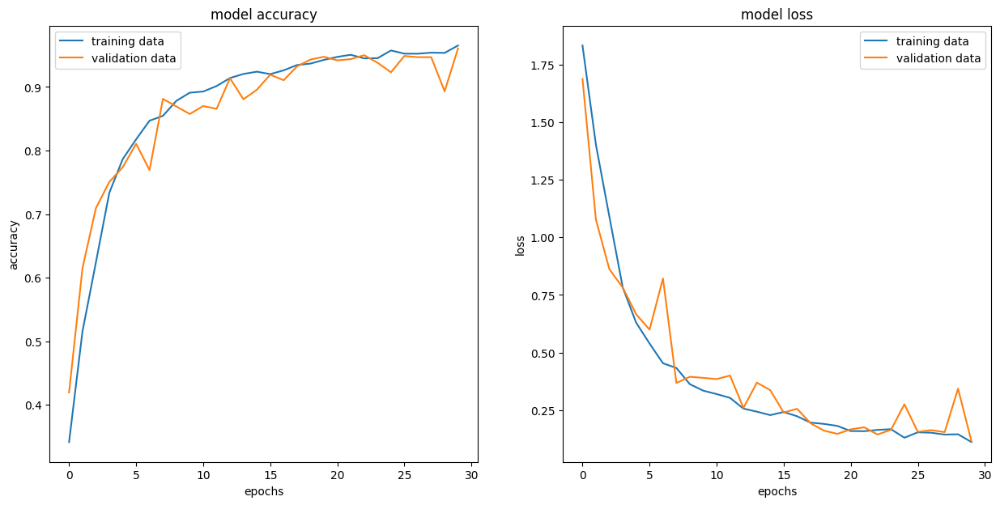

In [73]:
# model accuracy and loss plot 

plt.figure(figsize=(15,7)) 

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss'] 

plt.subplot(1,2,1)
plt.plot(acc)
plt.plot(val_acc)
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.title('model accuracy')
plt.legend(['training data', 'validation data'])

plt.subplot(1,2,2)
plt.plot(loss)
plt.plot(val_loss)
plt.xlabel('epochs')
plt.ylabel('loss')
plt.title('model loss') 
plt.legend(['training data', 'validation data'])

First Image to predict
First image's actual label: Tomato_healthy
1/1 [==============================] - 0s 47ms/step
[1.3714954e-06 5.8844869e-08 4.9327337e-04 6.4176561e-07 7.0494210e-08
 5.9797603e-06 2.8657472e-05 6.4070881e-11 5.9645405e-10 9.9946994e-01]
Predicted label: Tomato_healthy


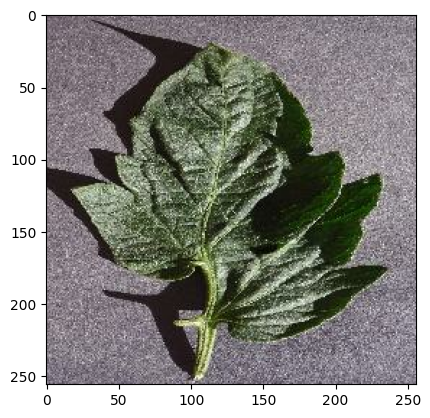

In [88]:
for image_batch, label_batch in test_ds.take(1): 
    first_image = image_batch[0].numpy().astype('uint8')
    first_label = label_batch[0]
    
    print('First Image to predict')
    plt.imshow(first_image)
    print(f'First image\'s actual label: {class_names[first_label]}')
    
    batch_prediction = model.predict(image_batch)
    print(batch_prediction[0])
    print(f'Predicted label: {class_names[np.argmax(batch_prediction[0])]}') 

In [97]:
def predict_img(model, img): 
    img_array = tf.keras.preprocessing.image.img_to_array(img) 
    img_array = tf.expand_dims(img_array, 0)  # create a batch
    
    predictions = model.predict(img_array)
    
    predicted_class = class_names[np.argmax(predictions[0])] 
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence 

1/1 [==============================] - 0s 24ms/step


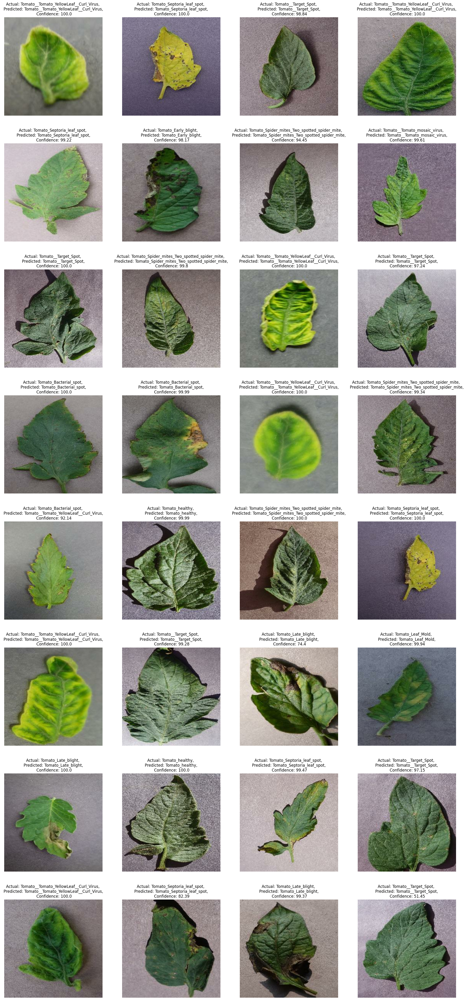

In [98]:
plt.figure(figsize=(25,55)) 

for images, labels in test_ds.take(1): 
    for i in range(32): 
        ax = plt.subplot(8,4,i+1)
        plt.imshow(images[i].numpy().astype('uint8'))
        
        predicted_class, confidence = predict_img(model, images[i].numpy())  
        actual_class = class_names[labels[i]]
        
        plt.title(f'Actual: {actual_class}, \n Predicted: {predicted_class}, \n Confidence: {confidence}')
        
        plt.axis('off') 

In [99]:
import os
os.makedirs('../models') 

In [100]:
os.listdir('../models') 

[]

In [103]:
# save the model
model_version = (0 if len(os.listdir('../models')) == 0 else max([int(i) for i in os.listdir('../models')]) ) + 1 
model.save(f'../models/{model_version}')

INFO:tensorflow:Assets written to: ../models/1\assets


INFO:tensorflow:Assets written to: ../models/1\assets
